# Three-Body Problem Simlation

### By: Gaurav Deshmukh

## Import Modules

In [1]:
#Define backend to display plots
%matplotlib inline
#Import HTML to convert animation to javascript animation or ffmpeg video if required
from IPython.display import HTML
#Import scipy
import scipy as sci
#Import plotting tools
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import animation
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

## Define constants

In [2]:
#Define universal gravitation constant
G=6.67408e-11 #N-m2/kg2

#Reference quantities
m_nd=1.989e+30 #kg
r_nd=5.326e+12 #m
v_nd=30000 #m/s
t_nd=79.91*365*24*3600*0.51 #s

#Net constants
K1=G*t_nd*m_nd/(r_nd**2*v_nd)
K2=v_nd*t_nd/r_nd

#Define masses
m1=1.1 #Alpha Centauri A
m2=0.907 #Alpha Centauri B
m3=1.0 #Third Star

## Define Initial Position Vectors

In [3]:
#Define initial position vectors
r1=[-0.5,0,0] #m
r2=[0.5,0,0] #m
r3=[0,1,0] #m

#Convert pos vectors to arrays
r1=np.array(r1,dtype="float64")
r2=np.array(r2,dtype="float64")
r3=np.array(r3,dtype="float64")

#Find Centre of Mass
r_com=(m1*r1+m2*r2+m3*r3)/(m1+m2+m3)

[-0.03209179  0.33255737  0.        ]


## Define Initial Velocity Vectors

In [17]:
#Define initial velocities
v1=[0.01,0.01,0] #m/s
v2=[-0.05,0,-0.1] #m/s
v3=[0,-0.01,0]

#Convert velocity vectors to arrays
v1=np.array(v1,dtype="float64")
v2=np.array(v2,dtype="float64")
v3=np.array(v3,dtype="float64")

#Find velocity of COM
v_com=(m1*v1+m2*v2+m3*v3)/(m1+m2+m3)

## Define function that describes the equations

In [32]:
def ThreeBodyEquations(w,t,G,m1,m2):
    #Unpack all the variables from the array "w"
    r1=w[:3]
    r2=w[3:6]
    r3=w[6:9]
    v1=w[9:12]
    v2=w[12:15]
    v3=w[15:18]
    
    pos = np.vstack((r1,r2,r3))
    vel = np.vstack((v1, v2, v3))

    #Find out distances between the three bodies
    r12=np.linalg.norm(r2-r1)
    r13=np.linalg.norm(r3-r1)
    r23=np.linalg.norm(r3-r2)
    
    #Define the derivatives according to the equations
    dv1bydt=K1*m2*(r2-r1)/r12**3+K1*m3*(r3-r1)/r13**3
    dv2bydt=K1*m1*(r1-r2)/r12**3+K1*m3*(r3-r2)/r23**3
    dv3bydt=K1*m1*(r1-r3)/r13**3+K1*m2*(r2-r3)/r23**3
    dr1bydt=K2*v1
    dr2bydt=K2*v2
    dr3bydt=K2*v3
    
    #Package the derivatives into one final size-18 array
    r12_derivs=np.concatenate((dr1bydt,dr2bydt))
    r_derivs=np.concatenate((r12_derivs,dr3bydt))
    v12_derivs=np.concatenate((dv1bydt,dv2bydt))
    v_derivs=np.concatenate((v12_derivs,dv3bydt))
    derivs=np.concatenate((r_derivs,v_derivs))
    print(derivs)

    return derivs


## Package initial parameters and define timespan

In [33]:
#Package initial parameters
init_params=np.array([r1,r2,r3,v1,v2,v3]) #Package initial parameters into one size-18 array
init_params=init_params.flatten() #Flatten the array to make it 1D
time_span=np.linspace(0,20,500) #Time span is 20 orbital years and 1000 points

## Run the odeint solver

In [34]:
#Run the ODE solver
import scipy.integrate
three_body_sol=sci.integrate.odeint(ThreeBodyEquations,init_params,time_span,args=(G,m1,m2))

NameError: name 'dervis' is not defined

## Store the position solutions into three distinct arrays

In [21]:
r1_sol=three_body_sol[:,:3]
r2_sol=three_body_sol[:,3:6]
r3_sol=three_body_sol[:,6:9]

## Plot the orbits of the three bodies

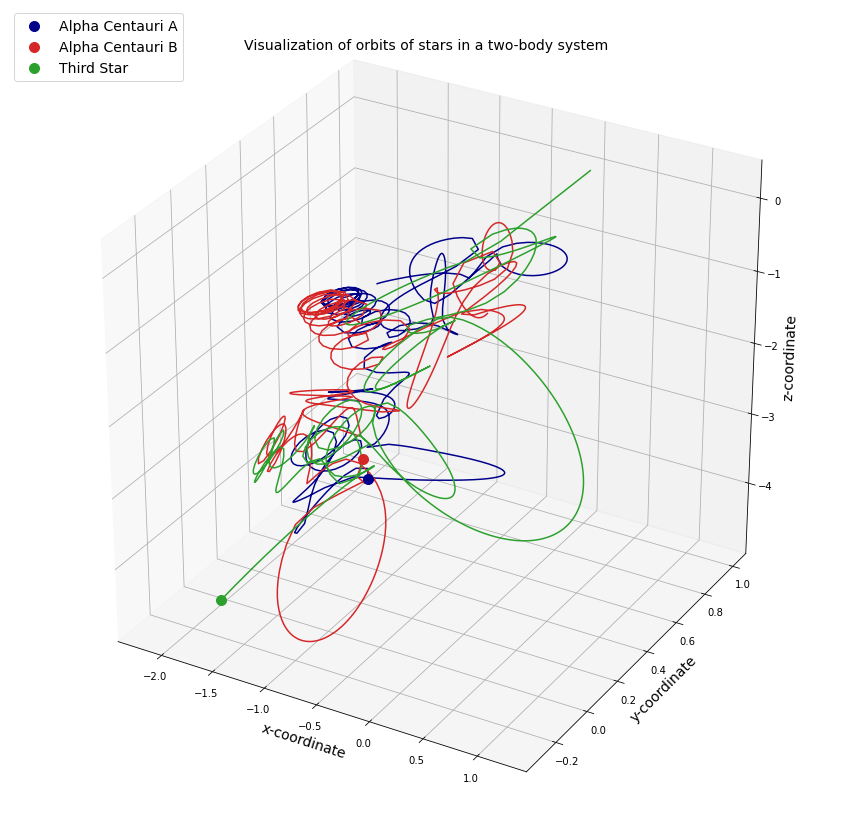

In [22]:
fig=plt.figure(figsize=(15,15))
ax=fig.add_subplot(111,projection="3d")
ax.plot(r1_sol[:,0],r1_sol[:,1],r1_sol[:,2],color="darkblue")
ax.plot(r2_sol[:,0],r2_sol[:,1],r2_sol[:,2],color="tab:red")
ax.plot(r3_sol[:,0],r3_sol[:,1],r3_sol[:,2],color="tab:green")
ax.scatter(r1_sol[-1,0],r1_sol[-1,1],r1_sol[-1,2],color="darkblue",marker="o",s=100,label="Alpha Centauri A")
ax.scatter(r2_sol[-1,0],r2_sol[-1,1],r2_sol[-1,2],color="tab:red",marker="o",s=100,label="Alpha Centauri B")
ax.scatter(r3_sol[-1,0],r3_sol[-1,1],r3_sol[-1,2],color="tab:green",marker="o",s=100,label="Third Star")
ax.set_xlabel("x-coordinate",fontsize=14)
ax.set_ylabel("y-coordinate",fontsize=14)
ax.set_zlabel("z-coordinate",fontsize=14)
ax.set_title("Visualization of orbits of stars in a two-body system\n",fontsize=14)
ax.legend(loc="upper left",fontsize=14)

## Animate the orbits of the three bodies

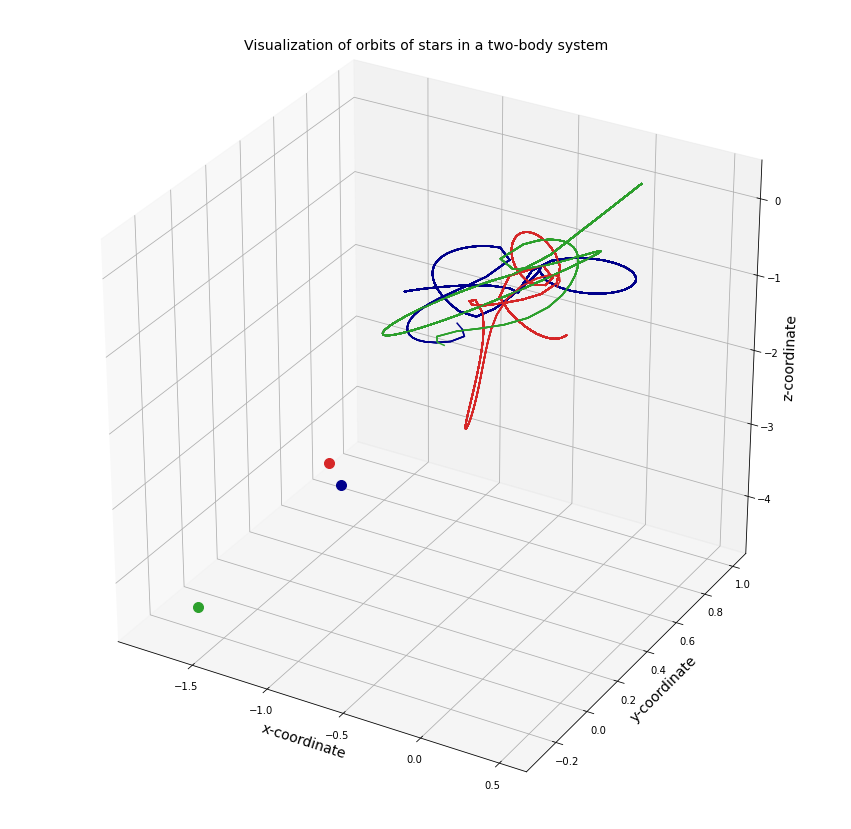

In [27]:
# #Animate
#Make the figure 
fig=plt.figure(figsize=(15,15))
ax=fig.add_subplot(111,projection="3d")

#Create new arrays for animation, this gives you the flexibility
#to reduce the number of points in the animation if it becomes slow
#Currently set to select every 4th point
r1_sol_anim=r1_sol[::1,:].copy()
r2_sol_anim=r2_sol[::1,:].copy()
r3_sol_anim=r3_sol[::1,:].copy()

#Set initial marker for planets, that is, blue,red and green circles at the initial positions
head1=[ax.scatter(r1_sol_anim[0,0],r1_sol_anim[0,1],r1_sol_anim[0,2],color="darkblue",marker="o",s=100)]
head2=[ax.scatter(r2_sol_anim[0,0],r2_sol_anim[0,1],r2_sol_anim[0,2],color="tab:red",marker="o",s=100)]
head3=[ax.scatter(r3_sol_anim[0,0],r3_sol_anim[0,1],r3_sol_anim[0,2],color="tab:green",marker="o",s=100)]

#Create a function Animate that changes plots every frame (here "i" is the frame number)
def Animate(i,head1,head2,head3):
    #Remove old markers
    head1[0].remove()
    head2[0].remove()
    head3[0].remove()
    
    #Plot the orbits (every iteration we plot from initial position to the current position)
    trace1=ax.plot(r1_sol_anim[:i,0],r1_sol_anim[:i,1],r1_sol_anim[:i,2],color="darkblue")
    trace2=ax.plot(r2_sol_anim[:i,0],r2_sol_anim[:i,1],r2_sol_anim[:i,2],color="tab:red")
    trace3=ax.plot(r3_sol_anim[:i,0],r3_sol_anim[:i,1],r3_sol_anim[:i,2],color="tab:green")
    
    #Plot the current markers
    head1[0]=ax.scatter(r1_sol_anim[i-1,0],r1_sol_anim[i-1,1],r1_sol_anim[i-1,2],color="darkblue",marker="o",s=100)
    head2[0]=ax.scatter(r2_sol_anim[i-1,0],r2_sol_anim[i-1,1],r2_sol_anim[i-1,2],color="tab:red",marker="o",s=100)
    head3[0]=ax.scatter(r3_sol_anim[i-1,0],r3_sol_anim[i-1,1],r3_sol_anim[i-1,2],color="tab:green",marker="o",s=100)
    return trace1,trace2,trace3,head1,head2,head3,

#Add a few bells and whistles
ax.set_xlabel("x-coordinate",fontsize=14)
ax.set_ylabel("y-coordinate",fontsize=14)
ax.set_zlabel("z-coordinate",fontsize=14)
ax.set_title("Visualization of orbits of stars in a two-body system\n",fontsize=14)

#Use the FuncAnimation module to make the animation
#If used in Jupyter Notebook, animation will not display only a static image will display with this command
anim=animation.FuncAnimation(fig,Animate,interval=20,repeat=False,blit=False,fargs=(head1,head2,head3))

#For Jupyter Notebook, enable to make a Javascript animation
matplotlib.rcParams['animation.embed_limit'] = 2**128 #Increase animation embed limit
HTML(anim.to_jshtml()) #Convert animation to jsanimation and display

#To save animation to disk, enable this command
#anim.save("ThreeBodyProblem_test.mp4")

## Find out position of centre of mass in the solution

In [28]:
rcom_sol=(m1*r1_sol+m2*r2_sol+m3*r3_sol)/(m1+m2+m3)

## Find out positions of the three bodies relative to COM

In [29]:
r1com_sol=r1_sol-rcom_sol
r2com_sol=r2_sol-rcom_sol
r3com_sol=r3_sol-rcom_sol

## Plot orbits relative to COM

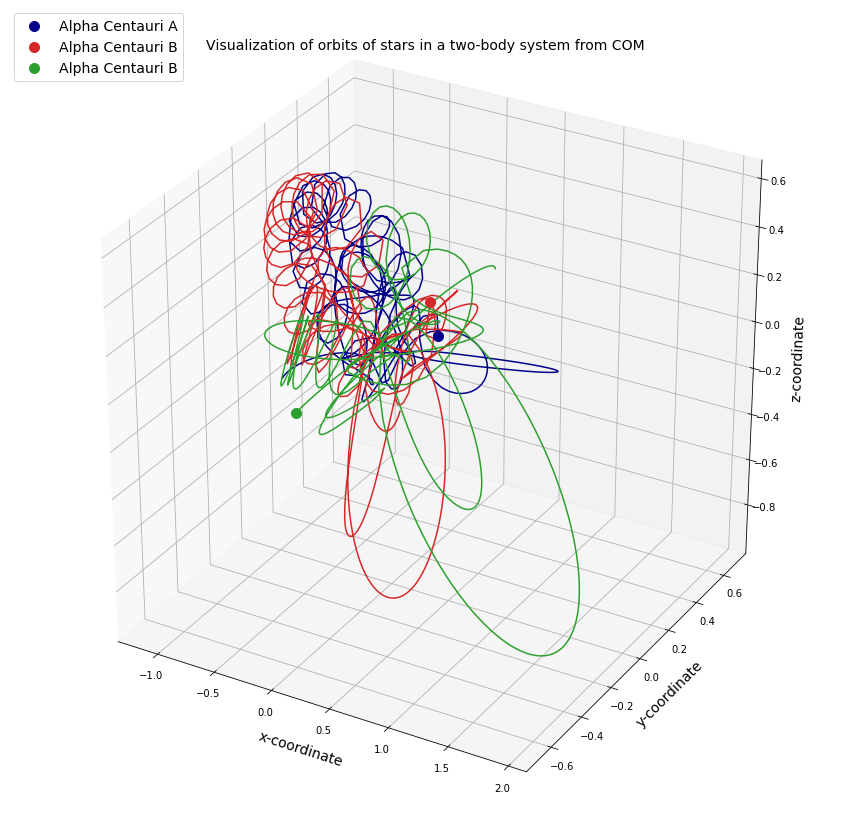

In [30]:
fig=plt.figure(figsize=(15,15))
ax=fig.add_subplot(111,projection="3d")
ax.plot(r1com_sol[:,0],r1com_sol[:,1],r1com_sol[:,2],color="darkblue")
ax.plot(r2com_sol[:,0],r2com_sol[:,1],r2com_sol[:,2],color="tab:red")
ax.plot(r3com_sol[:,0],r3com_sol[:,1],r3com_sol[:,2],color="tab:green")
ax.scatter(r1com_sol[-1,0],r1com_sol[-1,1],r1com_sol[-1,2],color="darkblue",marker="o",s=100,label="Alpha Centauri A")
ax.scatter(r2com_sol[-1,0],r2com_sol[-1,1],r2com_sol[-1,2],color="tab:red",marker="o",s=100,label="Alpha Centauri B")
ax.scatter(r3com_sol[-1,0],r3com_sol[-1,1],r3com_sol[-1,2],color="tab:green",marker="o",s=100,label="Alpha Centauri B")
ax.set_xlabel("\nx-coordinate",fontsize=14)
ax.set_ylabel("\ny-coordinate",fontsize=14)
ax.set_zlabel("\nz-coordinate",fontsize=14)
ax.set_title("Visualization of orbits of stars in a two-body system from COM\n",fontsize=14)
ax.legend(loc="upper left",fontsize=14)